Install DVC

In [ ]:
pip install dvc


initialise DVC in google drive

In [ ]:
%cd /content/drive/MyDrive/crowd prediction

/content/drive/MyDrive/crowd prediction


create a  dvc in this  directory

In [ ]:
!dvc init --subdir https://github.com/anslemhuncho/MACHINE-LEARNING-PROJECT

install ultralytics

In [ ]:
!pip install ultralytics


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 721.3/721.3 kB 3.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 23.7/23.7 MB 36.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 823.6/823.6 kB 41.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 14.1/14.1 MB 35.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 731.7/731.7 MB 1.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 410.6/410.6 MB 1.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 121.6/121.6 MB 5.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.5/56.5 MB 7.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 124.2/124.2 MB 6.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 196.0/196.0 MB 2.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 166.0/166.0 MB 2.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 99.1/99.1 kB 4.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━

import models

In [ ]:
from ultralytics import YOLO
import dvc.api
import os
import cv2
import shutil
import numpy as np
import pandas as pd
from PIL import Image
from tqdm import tqdm
from IPython.display import HTML, Video, Image, clear_output
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib import animation, rc
rc('animation', html='jshtml')


ModuleNotFoundError: No module named 'dvc'

In [ ]:
path_mp0 = '/content/drive/MyDrive/2.mp4'

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

In [ ]:
path_mp1=''


In [ ]:
import shutil
shutil.copy(path_mp0,path_mp1)


'/content/drive/MyDrive/3.mp4'

In [ ]:
import os
print(os.listdir('/content/drive/MyDrive/crowd prediction'))
print(os.listdir('/content/drive/MyDrive/normalised data'))

['SensitiveScene']
['immigration', 'appealing_for_peace', 'election', 'gender_equality', 'covid19', 'yellow_vests_movement', 'animals_protection', '.ipynb_checkpoints']


In [ ]:
model = YOLO("yolov8x.pt")


100%|██████████| 131M/131M [00:01<00:00, 74.2MB/s]


In [ ]:
!yolo task=detect mode=predict model=yolov8x.pt conf=0.001 source={path_mp1}


Ultralytics YOLOv8.1.29 🚀 Python-3.10.12 torch-2.2.1+cu121 CPU (Intel Xeon 2.20GHz)
YOLOv8x summary (fused): 268 layers, 68200608 parameters, 0 gradients, 257.8 GFLOPs

video 1/1 (frame 1/718) /content/drive/MyDrive/3.mp4: 384x640 32 persons, 1 bicycle, 1 dog, 7 backpacks, 5 handbags, 1 skis, 11 snowboards, 1 skateboard, 1 cell phone, 2 teddy bears, 4052.6ms
video 1/1 (frame 2/718) /content/drive/MyDrive/3.mp4: 384x640 27 persons, 1 bicycle, 1 motorcycle, 1 dog, 6 backpacks, 5 handbags, 1 skis, 7 snowboards, 1 kite, 3 teddy bears, 2433.8ms
video 1/1 (frame 3/718) /content/drive/MyDrive/3.mp4: 384x640 29 persons, 1 bicycle, 1 motorcycle, 7 backpacks, 3 handbags, 1 skis, 9 snowboards, 1 skateboard, 2443.2ms
video 1/1 (frame 4/718) /content/drive/MyDrive/3.mp4: 384x640 29 persons, 1 bicycle, 8 backpacks, 3 handbags, 2 skiss, 19 snowboards, 2423.2ms
video 1/1 (frame 5/718) /content/drive/MyDrive/3.mp4: 384x640 29 persons, 1 bicycle, 6 backpacks, 3 handbags, 3 skiss, 20 snowboards, 2402.1ms

In [ ]:
!ls runs/detect/predict



3.avi


In [ ]:
path_mp2="/content/drive/MyDrive/people walking a street.mp4"


In [ ]:
def video2frames(video_file=path_mp2, image_dir='/content/drive/MyDrive/crowd prediction', image_file='img_%s.png'):
    i = 0
    cap = cv2.VideoCapture(video_file)
    while(cap.isOpened()):
        flag, frame = cap.read()
        if flag == False:
            break
        cv2.imwrite(image_dir+image_file % str(i).zfill(5), frame)
        i += 1
    cap.release()

video2frames()


NameError: name 'cv2' is not defined

In [ ]:
paths0=[]
for dirname, _, filenames in os.walk('/content/drive/MyDrive/crowd prediction'):
    for filename in filenames:
        if filename[-4:]=='.png':
            paths0+=[(os.path.join(dirname, filename))]

images0=[]
for i in tqdm(range(len(paths0))):
    images0+=[cv2.imread(paths0[i])]


In [ ]:
import matplotlib.pyplot as plt
plt.rcParams['animation.embed_limit'] = 150
def create_animation(ims):
    fig=plt.figure(figsize=(12,8))
    plt.axis('off')
    im=plt.imshow(cv2.cvtColor(ims[0],cv2.COLOR_BGR2RGB))
    plt.close()

    def animate_func(i):
        im.set_array(cv2.cvtColor(ims[i],cv2.COLOR_BGR2RGB))
        return [im]

    return animation.FuncAnimation(fig, animate_func, frames=len(ims), interval=1000//10)

create_animation(np.array(images0))

In [ ]:
results = model.predict(path_mp1,conf=0.001)
print(len(results))



WARNING ⚠️ inference results will accumulate in RAM unless `stream=True` is passed, causing potential out-of-memory
errors for large sources or long-running streams and videos. See https://docs.ultralytics.com/modes/predict/ for help.

Example:
    results = model(source=..., stream=True)  # generator of Results objects
    for r in results:
        boxes = r.boxes  # Boxes object for bbox outputs
        masks = r.masks  # Masks object for segment masks outputs
        probs = r.probs  # Class probabilities for classification outputs

video 1/1 (frame 1/751) /home/diesel/Desktop/machinebrain/working/sample1/sample.mp4: 384x640 164 persons, 12 bicycles, 12 cars, 1 motorcycle, 1 bus, 14 trucks, 87 traffic lights, 2 stop signs, 4 benchs, 1 potted plant, 1 book, 1 clock, 318.9ms
video 1/1 (frame 2/751) /home/diesel/Desktop/machinebrain/working/sample1/sample.mp4: 384x640 169 persons, 8 bicycles, 13 cars, 2 buss, 14 trucks, 85 traffic lights, 2 stop signs, 4 benchs, 1 potted plant, 1 boo

In [ ]:
# # BOX=pd.DataFrame(columns=range(6))
# # for i in range(len(results)):
# #     arri=pd.DataFrame(results[i].boxes.boxes).astype(float)
# #     arri['i']=i
# #     BOX=pd.concat([BOX,arri])
# # BOX.columns=['x','y','x2','y2','confidence','class','i']
# # display(BOX)
# BOX=pd.DataFrame(columns=range(6))
# for i in range(len(results)):
#     arri=pd.DataFrame(results[i].boxes.boxes).astype(float)
#     arri['i']=i
#     BOX=pd.concat([BOX,arri])
# BOX.columns=['x','y','x2','y2','confidence','class','i']
# display(BOX)
BOX = pd.DataFrame(columns=['x1', 'y1', 'x2', 'y2', 'confidence', 'class', 'i'])

for i, result in enumerate(results):
    arri = result.boxes.xyxy.cpu().numpy()
    arri_df = pd.DataFrame(arri, columns=['x1', 'y1', 'x2', 'y2'])
    arri_df['confidence'] = result.boxes.conf.cpu().numpy()
    arri_df['class'] = result.boxes.cls.cpu().numpy()
    arri_df['i'] = i
    BOX = pd.concat([BOX, arri_df])

# Display the resulting DataFrame
display(BOX)





/tmp/ipykernel_4986/3464818901.py:23: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  BOX = pd.concat([BOX, arri_df])


,x1,y1,x2,y2,confidence,class,i
0,800.649048,371.467163,876.425415,452.017090,0.870971,2.0,0
1,825.407837,445.355042,889.457275,540.518799,0.747054,2.0,0
2,955.190552,397.329437,1042.846436,548.161255,0.746905,5.0,0
3,839.903870,223.324493,935.458557,361.832336,0.739759,7.0,0
4,878.116821,324.284851,958.565674,405.575989,0.727627,2.0,0
...,...,...,...,...,...,...,...
295,637.455811,417.807037,694.505615,457.487457,0.017167,3.0,750
296,1564.569946,492.608582,1587.296265,534.024841,0.016761,0.0,750
297,1564.978638,1028.760376,1647.450806,1077.887939,0.016611,58.0,750
298,724.227905,801.942871,771.266113,826.857666,0.016583,13.0,750


In [ ]:
class_map = {0: u'__background__', 1: u'person', 2: u'bicycle',3: u'car', 4: u'motorcycle', 5: u'airplane', 6: u'bus', 7: u'train', 8: u'truck', 9: u'boat', 10: u'traffic light', 11: u'fire hydrant', 12: u'stop sign', 13: u'parking meter', 14: u'bench', 15: u'bird', 16: u'cat', 17: u'dog', 18: u'horse', 19: u'sheep', 20: u'cow', 21: u'elephant', 22: u'bear', 23: u'zebra', 24: u'giraffe', 25: u'backpack', 26: u'umbrella', 27: u'handbag', 28: u'tie', 29: u'suitcase', 30: u'frisbee', 31: u'skis', 32: u'snowboard', 33: u'sports ball', 34: u'kite', 35: u'baseball bat', 36: u'baseball glove', 37: u'skateboard', 38: u'surfboard', 39: u'tennis racket', 40: u'bottle', 41: u'wine glass', 42: u'cup', 43: u'fork', 44: u'knife', 45: u'spoon', 46: u'bowl', 47: u'banana', 48: u'apple', 49: u'sandwich', 50: u'orange', 51: u'broccoli', 52: u'carrot', 53: u'hot dog', 54: u'pizza', 55: u'donut', 56: u'cake', 57: u'chair', 58: u'couch', 59: u'potted plant', 60: u'bed', 61: u'dining table', 62: u'toilet', 63: u'tv', 64: u'laptop', 65: u'mouse', 66: u'remote', 67: u'keyboard', 68: u'cell phone', 69: u'microwave', 70: u'oven', 71: u'toaster', 72: u'sink', 73: u'refrigerator', 74: u'book', 75: u'clock', 76: u'vase', 77: u'scissors', 78: u'teddy bear', 79: u'hair drier', 80: u'toothbrush'}

In [ ]:
BOX['class']=BOX['class'].apply(lambda x: class_map[int(x)+1])
BOX=BOX.reset_index(drop=True)
display(BOX)
display(BOX['class'].value_counts())


,x1,y1,x2,y2,confidence,class,i
0,800.649048,371.467163,876.425415,452.017090,0.870971,car,0
1,825.407837,445.355042,889.457275,540.518799,0.747054,car,0
2,955.190552,397.329437,1042.846436,548.161255,0.746905,bus,0
3,839.903870,223.324493,935.458557,361.832336,0.739759,truck,0
4,878.116821,324.284851,958.565674,405.575989,0.727627,car,0
...,...,...,...,...,...,...,...
225295,637.455811,417.807037,694.505615,457.487457,0.017167,motorcycle,750
225296,1564.569946,492.608582,1587.296265,534.024841,0.016761,person,750
225297,1564.978638,1028.760376,1647.450806,1077.887939,0.016611,potted plant,750
225298,724.227905,801.942871,771.266113,826.857666,0.016583,bench,750


class
person           142169
traffic light     38342
bicycle           11814
car                9156
truck              8481
bench              3639
bus                3273
motorcycle         2934
potted plant       2346
handbag            1036
backpack            520
umbrella            270
book                221
horse               185
suitcase            177
clock               167
stop sign           125
skateboard          115
chair                83
skis                 69
sports ball          66
tv                   43
boat                 34
sink                 11
fire hydrant          7
surfboard             5
dining table          5
vase                  1
wine glass            1
knife                 1
snowboard             1
bird                  1
kite                  1
tie                   1
Name: count, dtype: int64

In [ ]:
# data0=BOX[BOX['class']=='person']  #[BOX['confidence']>0.01]
# data0['i']=data0['i'].apply(lambda x: int(x))
# data0['y']=data0['y'].apply(lambda y: -y)
# data0=data0.reset_index(drop=True)
# data0['j']=data0.index.tolist()
# display(data0)
# print(len(data0))

# Create a DataFrame with 'class' column equal to 'person'
data0 = BOX[BOX['class'] == 'person']

# Convert 'i' column to integer type
data0['i'] = data0['i'].astype(int)

# Check if 'y' column exists before applying operations
if 'y' in data0.columns:
    # Negate 'y' values
    data0['y'] = data0['y'].apply(lambda y: -y)

# Reset index of the DataFrame
data0 = data0.reset_index(drop=True)

# Add a new column 'j' containing index values
data0['j'] = data0.index.tolist()

# Display the modified DataFrame
display(data0)

# data0 = BOX[BOX['class'] == 'person']  #[BOX['confidence']>0.01]
# data0['i'] = data0['i'].apply(lambda x: int(x))

# # Check if 'y' column exists before modifying it
# if 'y' in data0.columns:
#     data0['y'] = data0['y'].apply(lambda y: -y)
# else:
#     print("'y' column does not exist in data0.")

# data0 = data0.reset_index(drop=True)
# data0['j'] = data0.index.tolist()

# display(data0)
# print(len(data0))


/tmp/ipykernel_4986/490671312.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data0['i'] = data0['i'].astype(int)


,x1,y1,x2,y2,confidence,class,i,j
0,1195.071533,331.033203,1216.619019,389.966187,0.625621,person,0,0
1,1258.437378,343.596588,1278.423340,402.745148,0.614044,person,0,1
2,1315.706299,678.731567,1340.795898,756.795776,0.534787,person,0,2
3,1516.248535,633.902222,1540.690918,700.492920,0.524221,person,0,3
4,1235.391602,661.337219,1263.326050,741.356873,0.447472,person,0,4
...,...,...,...,...,...,...,...,...
142164,181.464325,607.311890,205.826263,655.370789,0.018053,person,750,142164
142165,138.033829,578.208130,161.286484,634.974792,0.017983,person,750,142165
142166,1242.296875,1022.171265,1274.896973,1064.655762,0.017625,person,750,142166
142167,1564.569946,492.608582,1587.296265,534.024841,0.016761,person,750,142167


In [ ]:
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots


In [ ]:
# print(data0['x'].min(),data0['x'].max())
# print(data0['y'].min(),data0['y'].max())
# Check if 'x' column exists before accessing it
if 'x' in data0.columns:
    # Print min and max values of 'x' column
    print(data0['x'].min(), data0['x'].max())

# Check if 'y' column exists before accessing it
if 'y' in data0.columns:
    # Print min and max values of 'y' column
    print(data0['y'].min(), data0['y'].max())



Index(['x1', 'y1', 'x2', 'y2', 'confidence', 'class', 'i', 'j'], dtype='object')


/tmp/ipykernel_4986/1238943428.py:17: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.scatterplot(data=data0[data0['i']==i], x="x1", y="y1", palette="Paired")


<Axes: xlabel='x1', ylabel='y1'>

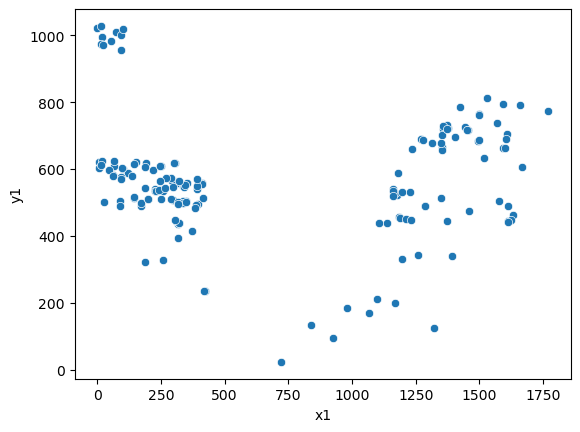

In [ ]:
# for i in range(len(results)):#len(results)
#     #plt.figure(figsize=(8,6))
#     sns.scatterplot(data=data0[data0['i']==i], x="x", y="y", palette="Paired") #, hue="i",
#     plt.title("People Positions "+str(i).zfill(5))
#     #plt.legend()
#     #plt.show()
#     plt.savefig('./sample3/fig_'+str(i).zfill(5)+'.png')
# Print the column names in data0 to verify the correct column name for 'x'
# print(data0.columns)

# # Assuming the correct column name for 'x' is 'x1', update the scatterplot code
# sns.scatterplot(data=data0[data0['i']==i], x="x1", y="y", palette="Paired")
# Print the column names in data0 to verify the correct column name for 'y'
print(data0.columns)

# Assuming the correct column name for 'y' is 'y1', update the scatterplot code
sns.scatterplot(data=data0[data0['i']==i], x="x1", y="y1", palette="Paired")




In [ ]:
paths3=[]
for dirname, _, filenames in os.walk('/home/diesel/Desktop/machinebrain/working/sample3/'):
    for filename in filenames:
        if filename[-4:]=='.png':
            paths3+=[(os.path.join(dirname, filename))]
paths3=sorted(paths3)
print(paths3[100:103])
images0=[]
for i in tqdm(range(0,len(paths3),2)):
    images0+=[cv2.imread(paths3[i])]

['/home/diesel/Desktop/machinebrain/working/sample3/fig_00100.png', '/home/diesel/Desktop/machinebrain/working/sample3/fig_00101.png', '/home/diesel/Desktop/machinebrain/working/sample3/fig_00102.png']


100%|██████████| 376/376 [00:05<00:00, 69.23it/s] 


In [ ]:
def create_animation(ims):
    fig=plt.figure(figsize=(12,8))
    plt.axis('off')
    im=plt.imshow(cv2.cvtColor(ims[0],cv2.COLOR_BGR2RGB))
    plt.close()

    def animate_func(i):
        im.set_array(cv2.cvtColor(ims[i],cv2.COLOR_BGR2RGB))
        return [im]

    return animation.FuncAnimation(fig, animate_func, frames=len(ims), interval=1000//10)

create_animation(np.array(images0))


In [ ]:
data1=data0[['i']].copy()
data1['count']=1
data2=data1.groupby('i',as_index=False).sum()
display(data2)

,i,count
0,0,164
1,1,169
2,2,167
3,3,169
4,4,168
...,...,...
746,746,177
747,747,178
748,748,176
749,749,182


In [ ]:
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

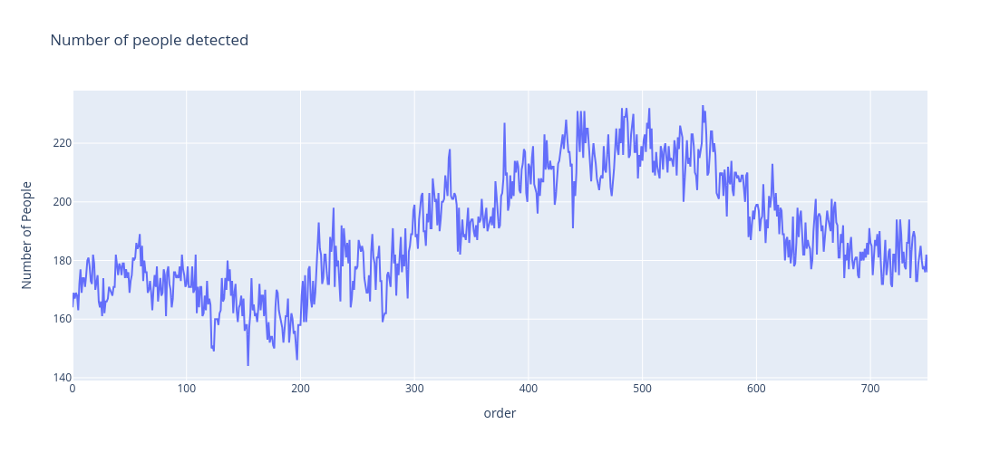

In [ ]:
fig=make_subplots(specs=[[{"secondary_y":False}]])
fig.add_trace(go.Scatter(x=data2['i'],y=data2['count'],name='person'),secondary_y=False,)
fig.update_layout(autosize=False,width=700,height=500,title_text="Number of people detected")
fig.update_xaxes(title_text="order")
fig.update_yaxes(title_text="Number of People",secondary_y=False)
fig.show()
